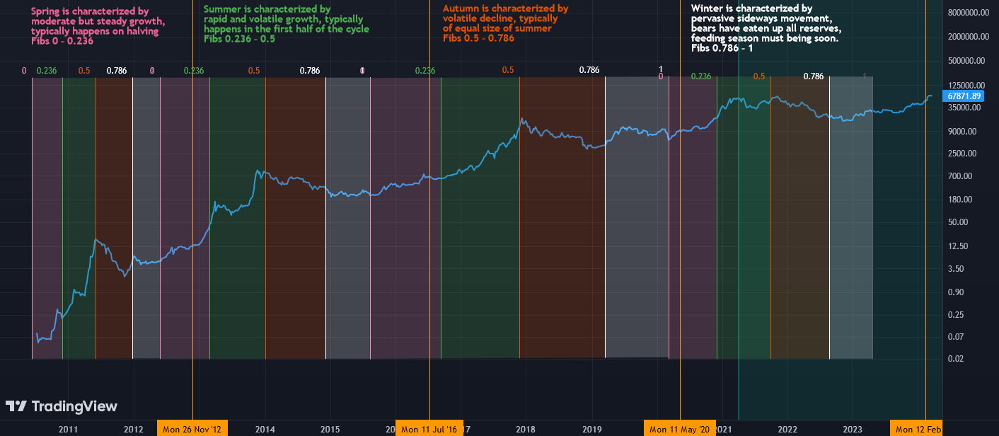

Source: https://www.tradingview.com/chart/BLX/Rqj06lw7-Bitcoin-Seasons/

Bitcoin price seasonality is bound to two factors: the seasonality of the global economy and bitcoin *halving* events. The term *halving* refers to the reduction of mining rewards by a factor of 2, which is designed to gradually slow production of new bitcoins and make the resource more scarce, thereby boosting the price increase.

The chart above was created in the mid 2021 (at the border of the <font color='#0d6058'>cyan shade</font>). <font color='orange'>Orange</font> lines mark the halving events, which are set to occur once in rougly 4 years (every 210,000 blocks). Estimation of the date of the last halving is outdated: in late March 2024 it is believed to will have happen on 17. Apr. 2024. 

The seasonality patterns - likely determined by eye - withstood the test of time quite well. But how well? And can they be utilized for price forecasting?

This chart inspired this - more formal - analysis of Bitcoin seasonality behavior.

# Bitcoin price prediction

The goal of this analysis is: 
* To verify the chart above, i.e. 
    * EITHER confirm and reproduce the known seasonal patterns 
    * OR deny and find new seasonality behaviour
* To understand seasonal patterns of the first and largest cryptocurrency and build up an educated intuition
* To build a predictive model for the price

# THIS IS A WIP

# Preparation

Installing the necessary packages. Don't mind the warnings, they don't matter.

In [1]:
!pip install pycaret --quiet

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
beatrix-jupyterlab 2023.128.151533 requires jupyterlab~=3.6.0, but you have jupyterlab 4.1.5 which is incompatible.
libpysal 4.9.2 requires packaging>=22, but you have packaging 21.3 which is incompatible.
libpysal 4.9.2 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
momepy 0.7.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
osmnx 1.9.1 requires shapely>=2.0, but you have shapely 1.8.5.post1 which is incompatible.
spopt 0.6.0 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
xarray 2024.2.0 requires packaging>=22, but you have packaging 21.3 which is incompatible.
ydata-profiling 4.6.4 requires numpy<1.26,>=1.16.0, but you have numpy 1.26.4 which is incompatible.


Imports

In [2]:
import numpy as np 
import pandas as pd 
### from matplotlib import pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import plotly.subplots as psp

## EDA and Machine Learning
from sklearn.preprocessing import MinMaxScaler, PowerTransformer
from sktime.transformations.series.boxcox import LogTransformer
from pycaret.time_series import TSForecastingExperiment
from pycaret.time_series import *

# Deep Learning
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

import warnings
warnings.filterwarnings('ignore')

### plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pitayasmoothie-light.mplstyle')
pio.templates.default = "plotly_white"

2024-03-21 17:09:28.222576: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-21 17:09:28.222716: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-21 17:09:28.421363: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Importing the [Kaggle dataset](https://www.kaggle.com/datasets/krairy/bitcoin-daily-price-and-vol-jul-2010-mar-2024/data)

In [3]:
df = pd.read_csv('/kaggle/input/bitcoin-daily-price-and-vol-jul-2010-mar-2024/btc.csv', 
                  index_col=0, parse_dates=['Date'])

Having a look at the data:

*Zoom in to see volume bars. The chart can be a bit laggy.*

In [4]:
fig = psp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Candlestick(x=df.index,
                open=df['Open'], high=df['High'],
                low=df['Low'], close=df['Close']), secondary_y=True)
fig.add_trace(go.Bar(x=df.index,y=df.Volume, marker={"color": "rgba(64,64,64,0.64)"}), secondary_y=False)
fig.update_yaxes(title="Price $", secondary_y=True, showgrid=True)
fig.update_yaxes(title="Volume $", secondary_y=False, showgrid=False)
fig.update_layout(title='BTC / USDT (from investing.com and yahoo!.finance)')
fig.show()

## or simply use
#df.Close.plot(backend='plotly')

# Exploration



## EDA with `pycaret`

Let's generate an empty `experiment` with all default parameters. Since we are not modelling, all parameters relating to forecasting (such as forecast horizon `fh`, train-test split settings, etc.) don't matter.

In [5]:
eda = TSForecastingExperiment()
eda.setup(data=df.Close, fh=700, max_sp_to_consider=1500)

,Description,Value
0,session_id,688
1,Target,Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(4994, 1)"
5,Transformed data shape,"(4994, 1)"
6,Transformed train set shape,"(4294, 1)"
7,Transformed test set shape,"(700, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


The statistical tests revealed A BUNCH OF seasonalities. The periods are ordered by their strength: the numbers in the beginning are more important than at the end of the list.
Of course, even though everything somewhat statistically *significant*, not every seasonality period will be immideately relevant for us. 

The closest periods to what we are looking for - $1461$ days = 4 years - that the tests revealed are $1159$ (less significant) and $1120$ days (more significant). Interestingly, the most statistically significant period is $360$ days, which makes roughly 1 year. 

Let's test some of the largest seasonality periods

In [6]:
eda.plot_model(plot="decomp", data_kwargs={'seasonal_period': 360}, fig_kwargs={"height": 800, 'width': 1200})

In [7]:
eda.plot_model(plot="decomp", data_kwargs={'seasonal_period': 880}, fig_kwargs={"height": 800, 'width': 1200})

In [8]:
eda.plot_model(plot="decomp", data_kwargs={'seasonal_period': 1120}, fig_kwargs={"height": 800, 'width': 1200})

Let's run the `diagnostics` of our data. 

**The plots below**
1. The first plot is the raw data. *Despite the title, it is **not** transformed, because we did not apply any transformation yet. This is just the close price of BTC in USD.* 
2. The `Periodogram` peaks f ~= 0, indicating that we need to difference the data. 
    * There is some periodicity, but low frequencies (corresponding to the periods of ~4 years = 1461 days we want to investigate) are hard to see on those plots, especially before the transformations. Short prominent periods include 40, 15, 11 and 5.6 days. 
3. The `Histogram` shows distribution of the prices. Of course, it is highly skewed because of the overall exponential growth. 
4. The `Q-Q` plot suffers from the same drastic skewness of the prices; we will have to transform our data
5. The `ACF` plot reports on the autocorrelation. 
6. The `PACF` plot reports on the partial autocorrelation: *how does yesterday affects today*. 

In [9]:
eda.plot_model(plot="diagnostics", fig_kwargs={"height": 800, "width": 1200})

Our diagnosutic plots indicated the need to difference and the presence of some small seasonal periods (9, 11.5, 31, etc.). **Let's see what happends when we remove this from the model. What other characteristics are left in the model that would need to be taken care of?** 

This can be achieved through the difference plots. Along with the difference plots, we will plot the corresponding ACF, PACF and Periodogram for further diagnostics.

**Plots below**

* Row 1: Original
* Row 2: d = 1
* Row 3: First (d = 1) then (D = 1, s = 9)
* Row 3: First (d = 1) then (D = 1, s = 31)
    * Corresponds to applying a standard first difference to handle trend, and
     followed by a seasonal difference (at lag s) to attempt to account for
     seasonal dependence.
     
Reference: [sktime docs](https://www.sktime.org/en/stable/api_reference/auto_generated/sktime.transformations.series.difference.Differencer.html), [pycaret time series tutorial](https://nbviewer.org/github/pycaret/pycaret/blob/master/tutorials/time_series/forecasting/univariate_without_exogeneous_part1.ipynb)

In [10]:
eda.plot_model(
    plot="diff",
    data_kwargs={"lags_list": [[1], [1, 9], [1, 31]], "acf": True, "pacf": True, "periodogram": True},
    fig_kwargs={"height": 800, "width": 1500}
)

The only helpful tranformation so far was de-trending. We'll discard the lags of 9 and 31, they just introduce new patterns. Also, we need to achieve *homoscedascisity*, i.e. make the variance *more constant* over time (right now it explodes at the latest periods). Possible transformations include:

* Power transformation 
    * Will make standard deviation more constant
* Log transform
    * Looking at an asset price on the vertica log scale a very common practice for finance, It will account for the natural exponential growth. 

### Log transform

In [11]:
#Instantiate the transformer (from `sktime`)
fe_target_rr = [LogTransformer()]

## Setting up the new experiment
eda_logtransf = TSForecastingExperiment()
eda_logtransf.setup(data=df.Close, fe_target_rr=fe_target_rr, fh=700, max_sp_to_consider=1500)

,Description,Value
0,session_id,5642
1,Target,Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(4994, 1)"
5,Transformed data shape,"(4994, 1)"
6,Transformed train set shape,"(4294, 1)"
7,Transformed test set shape,"(700, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


See what did log transform improve

In [12]:
eda_logtransf.plot_model(plot="diagnostics", fig_kwargs={"height": 800, "width": 1200})

---

## First modelling

For EDA on time series we will use [`PyCaret`](https://pycaret.gitbook.io/docs) library. The workflow it imposes starts from predictive modelling and lands on the model analysis. Hence, we are starting with experiment set up, then will model the time series with a few algorithms, select the best one and analyse it.

In [13]:
exp_wide = TSForecastingExperiment()

Let's try to analyse the large fluctuations first

In [14]:
exp_wide.setup(df.Close, fh=700, session_id=123, fe_target_rr={})
exp_wide

,Description,Value
0,session_id,123
1,Target,Close
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(4994, 1)"
5,Transformed data shape,"(4994, 1)"
6,Transformed train set shape,"(4294, 1)"
7,Transformed test set shape,"(700, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


In [15]:
exp_wide.check_stats()

,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Transformed,Length,,4994.0
1,Summary,Statistics,Transformed,# Missing Values,,0.0
2,Summary,Statistics,Transformed,Mean,,10766.334381
3,Summary,Statistics,Transformed,Median,,1909.25
4,Summary,Statistics,Transformed,Standard Deviation,,15811.764818
5,Summary,Statistics,Transformed,Variance,,250011906.674474
6,Summary,Statistics,Transformed,Kurtosis,,1.734916
7,Summary,Statistics,Transformed,Skewness,,1.632875
8,Summary,Statistics,Transformed,# Distinct Values,,4031.0
9,White Noise,Ljung-Box,Transformed,Test Statictic,"{'alpha': 0.05, 'K': 24}",113276.589781


Let's look which models are available for our experiment.

In [16]:
model_metadata = exp_wide.models()
model_metadata['Name']

ID
naive                                               Naive Forecaster
grand_means                                   Grand Means Forecaster
snaive                                     Seasonal Naive Forecaster
polytrend                                Polynomial Trend Forecaster
arima                                                          ARIMA
auto_arima                                                Auto ARIMA
exp_smooth                                     Exponential Smoothing
ets                                                              ETS
theta                                               Theta Forecaster
stlf                                                            STLF
croston                                                      Croston
bats                                                            BATS
tbats                                                          TBATS
prophet                                                      Prophet
lr_cds_dt                 Linea

**Note**: if you do NOT restrict the model list to the certain models, it will run for too long! We are not modelling quite yet, so it is not worth it. 

Visualzing the train-test split.

In [17]:
eda.plot_model(plot="train_test_split", fig_kwargs={"height": 400, "width": 900})

In [18]:
eda.plot_model(plot="cv", fig_kwargs={"height": 400, "width": 900})

In [19]:
exp_smoth = exp_wide.create_model('exp_smooth')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2016-07-19,145.7832,84.5764,3783.4512,5737.2076,0.5759,0.9593,-0.7240
1,2018-06-19,10.2770,3.7101,1762.4943,2186.3274,0.2919,0.2575,0.0468
2,2020-05-19,98.6035,46.4914,25411.9202,30646.8920,0.5859,0.9316,-2.1098
Mean,NaT,84.8879,44.9260,10319.2886,12856.8090,0.4846,0.7161,-0.9290
SD,NaT,56.1639,33.0320,10703.9468,12662.7400,0.1363,0.3245,0.8923


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [20]:
exp_wide.plot_model(exp_smoth, plot='decomp')

# Conclusions

# Sources of inspiration and resources

**Notebooks of other Kagglers:**
* https://www.kaggle.com/code/myonin/bitcoin-price-prediction-by-arima
    
   
**Blog posts** 
* https://machinelearningmastery.com/time-series-prediction-lstm-recurrent-neural-networks-python-keras/

**Documentation and tutorials**
* [Time series 101 with PyCaret](https://colab.research.google.com/github/pycaret/pycaret/blob/master/tutorials/Tutorial%20-%20Time%20Series%20Forecasting.ipynb#scrollTo=f449e9eb)
* https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM
* [Tensor Flow tutorial on time series analysis](https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM)